# Import libraries

In [1]:
import os
from re import search
from dfply import *
import scvelo as scv

In [2]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# Load settings

In [3]:
if search("ricard", os.uname()[1]):
    exec(open('/Users/ricard/gastrulation_multiome_10x/settings.py').read())
    exec(open('/Users/ricard/gastrulation_multiome_10x/utils.py').read())
elif search("ebi", os.uname()[1]):
    exec(open('/homes/ricard/gastrulation_multiome_10x/settings.py').read())
    exec(open('/homes/ricard/gastrulation_multiome_10x/utils.py').read())
else:
    exit("Computer not recognised")

## Define I/O

In [4]:
io["anndata_scvelo"] = io["basedir"] + "/processed/rna/velocyto/anndata_scvelo.h5ad"
io["outdir"] = io["basedir"] + "/..."

## Define options 

scanpy options

In [5]:
# %%capture
# sc.settings.verbosity = 3
# sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80, frameon=False, figsize=(8, 7), facecolor='white')

In [6]:
opts["samples"] = [
	# "E7.5_rep1",
	# "E7.5_rep2"
	"E8.5_rep1",
	"E8.5_rep2"
]

opts["celltypes"] = [
   "Epiblast",
   "Primitive_Streak",
   "Caudal_epiblast",
   # "PGC",
   "Anterior_Primitive_Streak",
   "Notochord",
   "Def._endoderm",
   "Gut",
   "Nascent_mesoderm",
   "Mixed_mesoderm",
   "Intermediate_mesoderm",
   "Caudal_Mesoderm",
   "Paraxial_mesoderm",
   "Somitic_mesoderm",
   "Pharyngeal_mesoderm",
   "Cardiomyocytes",
   "Allantois",
   "ExE_mesoderm",
   "Mesenchyme",
   # "Haematoendothelial_progenitors",
   # "Endothelium",
   # "Blood_progenitors_1",
   # "Blood_progenitors_2",
   # "Erythroid1",
   # "Erythroid2",
   # "Erythroid3"
   "NMP",
   "Rostral_neurectoderm",
   "Caudal_neurectoderm",
   "Neural_crest",
   "Forebrain_Midbrain_Hindbrain",
   "Spinal_cord"
   # "Surface_ectoderm"
   # "Visceral_endoderm",
   # "ExE_endoderm",
   # "ExE_ectoderm",
   # "Parietal_endoderm"
]

## Load cell metadata

In [7]:
metadata = (pd.read_table(io["metadata"]) >>
    mask(X.pass_rnaQC==True, X.doublet_call==False) >>
    mask(X["sample"].isin(opts["samples"]), X["celltype.mapped"].isin(opts["celltypes"]))
)
metadata.shape

(9045, 28)

In [8]:
metadata.head()

,cell,sample,barcode,archR_cell,nFeature_RNA,nCount_RNA,mtFraction_RNA,pass_rnaQC,celltype.mapped,celltype.score,...,celltype.denoised,TSSEnrichment_atac,ReadsInTSS_atac,PromoterRatio_atac,NucleosomeRatio_atac,nFrags_atac,BlacklistRatio_atac,pass_atacQC,celltype.predicted,stage
22527,E8.5_rep1_AAACATGCAAAGGCCA-1,E8.5_rep1,AAACATGCAAAGGCCA-1,E8.5_rep1#AAACATGCAAAGGCCA-1,5249.0,15928.0,9.561778,True,Paraxial_mesoderm,0.60,...,Paraxial_mesoderm,13.342,3726.0,0.189571,1.520021,38516.0,0.013890,True,Paraxial_mesoderm,E8.5
22528,E8.5_rep1_AAACATGCAACCTAAT-1,E8.5_rep1,AAACATGCAACCTAAT-1,NaN,2578.0,5062.0,10.845516,True,Forebrain_Midbrain_Hindbrain,0.92,...,Forebrain_Midbrain_Hindbrain,NaN,NaN,NaN,NaN,NaN,NaN,False,Forebrain_Midbrain_Hindbrain,E8.5
22529,E8.5_rep1_AAACATGCAATGCCCG-1,E8.5_rep1,AAACATGCAATGCCCG-1,E8.5_rep1#AAACATGCAATGCCCG-1,4934.0,14023.0,8.286387,True,Somitic_mesoderm,0.52,...,Somitic_mesoderm,15.108,3212.0,0.188903,1.595409,31773.0,0.015516,True,Somitic_mesoderm,E8.5
22531,E8.5_rep1_AAACATGCACCAGGTT-1,E8.5_rep1,AAACATGCACCAGGTT-1,E8.5_rep1#AAACATGCACCAGGTT-1,4493.0,12579.0,7.504571,True,Mesenchyme,1.00,...,Mesenchyme,14.364,3685.0,0.200961,1.836251,35161.0,0.017192,True,Mesenchyme,E8.5
22533,E8.5_rep1_AAACATGCACTATGGC-1,E8.5_rep1,AAACATGCACTATGGC-1,E8.5_rep1#AAACATGCACTATGGC-1,2430.0,4788.0,18.984962,True,Somitic_mesoderm,0.44,...,Intermediate_mesoderm,10.851,3288.0,0.183847,1.584343,36049.0,0.014147,True,Intermediate_mesoderm,E8.5


# Load anndata object

In [9]:
adata = load_adata(
    adata_file = io["anndata_scvelo"], 
    cells = metadata.cell.values, 
    normalise = True, 
    filter_lowly_expressed_genes = False
)
adata

AnnData object with n_obs × n_vars = 9045 × 32285
    obs: 'cell', 'sample', 'barcode', 'archR_cell', 'nFeature_RNA', 'nCount_RNA', 'mtFraction_RNA', 'pass_rnaQC', 'celltype.mapped', 'celltype.score', 'closest.cell', 'cxds_score', 'cxds_call', 'bcds_score', 'bcds_call', 'hybrid_score', 'hybrid_call', 'doublet_call', 'celltype.denoised', 'TSSEnrichment_atac', 'ReadsInTSS_atac', 'PromoterRatio_atac', 'NucleosomeRatio_atac', 'nFrags_atac', 'BlacklistRatio_atac', 'pass_atacQC', 'celltype.predicted', 'stage', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size'
    var: 'gene_ids', 'feature_types', 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'celltype.mapped_colors', 'stage_colors', 'log1p'
    layers: 'spliced', 'unspliced'

## Feature selection

In [10]:
sc.pp.highly_variable_genes(adata, layer=None, n_top_genes=2500)

# Dimensionality reduction

## PCA

Run PCA

In [11]:
sc.tl.pca(adata, n_comps=25, svd_solver='arpack')

Plot PCA

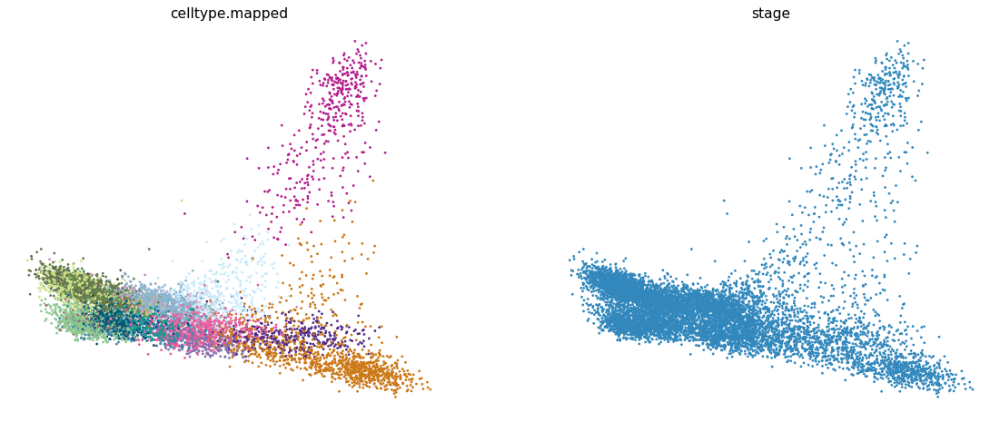

In [12]:
sc.pl.pca(adata, components=[1,2], color=["celltype.mapped","stage"], size=25, legend_loc=None)

## k-NN graph

Build kNN graph

In [13]:
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=25)

## UMAP

Run UMAP

In [14]:
sc.tl.umap(adata, min_dist=0.5, n_components=2)

Plot UMAP

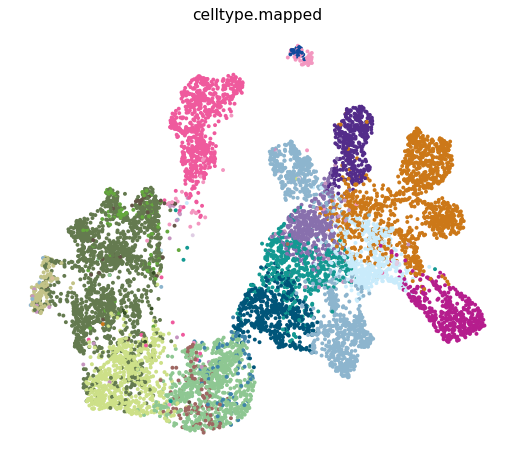

In [15]:
# sc.pl.umap(adata, color=["celltype.mapped","stage"], size=25, legend_loc="on data")
sc.pl.umap(adata, color=["celltype.mapped"], size=50, legend_loc=None)

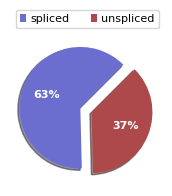

In [16]:
scv.pl.proportions(adata)

Preprocessing requisites consist of gene selection by detection (with a minimum number of counts) and high variability (dispersion), normalizing every cell by its total size and logarithmizing X. Filtering and normalization is applied in the same vein to spliced/unspliced counts and X. Logarithmizing is only applied to X. If X is already preprocessed from former analysis, it will not be touched.

In [17]:
scv.pp.filter_and_normalize(adata, n_top_genes=1500, min_shared_counts=20)

Filtered out 22252 genes that are detected 20 counts (shared).
Normalized count data: spliced, unspliced.
Extracted 1500 highly variable genes.


Further, we need the first and second order moments (means and uncentered variances) computed among nearest neighbors in PCA space, summarized in scv.pp.moments, which internally computes scv.pp.pca and scv.pp.neighbors. First order is needed for deterministic velocity estimation, while stochastic estimation also requires second order moments.

In [18]:
scv.pp.moments(adata, n_pcs=25, n_neighbors=30)

computing neighbors
    finished (0:00:03) --> added 
    'distances' and 'connectivities', weighted adjacency matrices (adata.obsp)
computing moments based on connectivities
    finished (0:00:01) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


## Estimate velocities

Velocities are vectors in gene expression space and represent the direction and speed of movement of the individual cells. The velocities are obtained by modeling transcriptional dynamics of splicing kinetics, either stochastically (default) or deterministically (by setting mode='deterministic'). For each gene, a steady-state-ratio of pre-mature (unspliced) and mature (spliced) mRNA counts is fitted, which constitutes a constant transcriptional state. Velocities are then obtained as residuals from this ratio. Positive velocity indicates that a gene is up-regulated, which occurs for cells that show higher abundance of unspliced mRNA for that gene than expected in steady state. Conversely, negative velocity indicates that a gene is down-regulated.  

The computed velocities are stored in adata.layers just like the count matrices.



Recover the full splicing kinetics of specified genes. The model infers transcription rates, splicing rates, degradation rates, as well as cell-specific latent time and transcriptional states, estimated iteratively by expectation-maximization.  

scvelo.tl.recover_dynamics(data, var_names='velocity_genes', n_top_genes=None, max_iter=10, assignment_mode='projection', t_max=None, fit_time=True, fit_scaling=True, fit_steady_states=True, fit_connected_states=None, fit_basal_transcription=None, use_raw=False, load_pars=None, return_model=None, plot_results=False, steady_state_prior=None, add_key='fit', copy=False, n_jobs=None, backend='loky', **kwargs)

In [19]:
scv.tl.recover_dynamics(adata)

recovering dynamics (using 1/80 cores)


  0%|          | 0/1096 [00:00<?, ?gene/s]

    finished (0:26:37) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)


Estimates velocities in a gene-specific manner.

scvelo.tl.velocity(data, vkey='velocity', mode='stochastic', fit_offset=False, fit_offset2=False, filter_genes=False, groups=None, groupby=None, groups_for_fit=None, constrain_ratio=None, use_raw=False, use_latent_time=None, perc=[5, 95], min_r2=0.01, min_likelihood=0.001, r2_adjusted=None, use_highly_variable=True, diff_kinetics=None)

In [20]:
scv.tl.velocity(adata, mode="dynamical")

computing velocities
    finished (0:00:14) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


Save model

In [41]:
# adata.obs["pass_atacQC"] = None

In [42]:
io["outfile"] = io["basedir"] + "/processed/rna/velocyto/anndata_scvelo_E85.h5ad"
adata.write_h5ad(io["outfile"])

... storing 'pass_atacQC' as categorical


## Load precomputed scVelo model

In [23]:
# io["scvelo"] = "/hps/nobackup2/research/stegle/users/ricard/gastrulation10x/processed/adata_dynamical_top1000.h5"

In [24]:
# adata_csv = sc.read(io["scvelo"])

## Downstream analysis

Computes velocity graph based on cosine similarities.

In [25]:
#scv.tl.velocity_graph(adata)
scv.tl.velocity_graph(adata, approx=True) 

computing velocity graph
    finished (0:00:02) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [26]:
# scv.pl.velocity_embedding(adata, basis='umap', color='celltype.mapped', arrow_length=10, arrow_size=10, dpi=120)

scvelo.pl.velocity_embedding_grid(adata, basis=None, vkey='velocity', density=None, smooth=None, min_mass=None, arrow_size=None, arrow_length=None, arrow_color=None, scale=None, autoscale=True, n_neighbors=None, recompute=None, X=None, V=None, X_grid=None, V_grid=None, principal_curve=False, color=None, use_raw=None, layer=None, color_map=None, colorbar=True, palette=None, size=None, alpha=0.2, perc=None, sort_order=True, groups=None, components=None, projection='2d', legend_loc='none', legend_fontsize=None, legend_fontweight=None, xlabel=None, ylabel=None, title=None, fontsize=None, figsize=None, dpi=None, frameon=None, show=None, save=None, ax=None, ncols=None, **kwargs)

computing velocity embedding
    finished (0:00:02) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


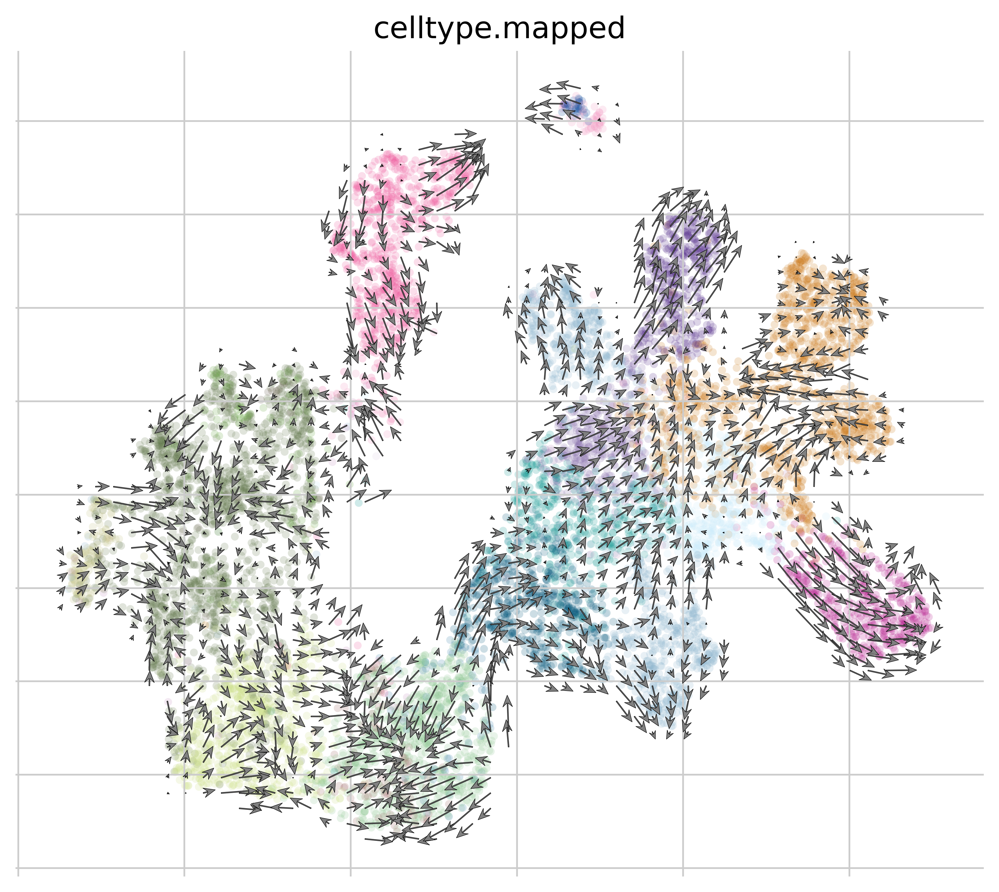

In [27]:
scv.pl.velocity_embedding_grid(adata, basis='umap', color='celltype.mapped', arrow_length=5, arrow_size=2, dpi=500)

scvelo.pl.velocity_embedding_stream(adata, basis=None, vkey='velocity', density=None, smooth=None, min_mass=None, cutoff_perc=None, arrow_color=None, linewidth=None, n_neighbors=None, recompute=None, color=None, use_raw=None, layer=None, color_map=None, colorbar=True, palette=None, size=None, alpha=0.3, perc=None, X=None, V=None, X_grid=None, V_grid=None, sort_order=True, groups=None, components=None, legend_loc='on data', legend_fontsize=None, legend_fontweight=None, xlabel=None, ylabel=None, title=None, fontsize=None, figsize=None, dpi=None, frameon=None, show=None, save=None, ax=None, ncols=None, **kwargs)

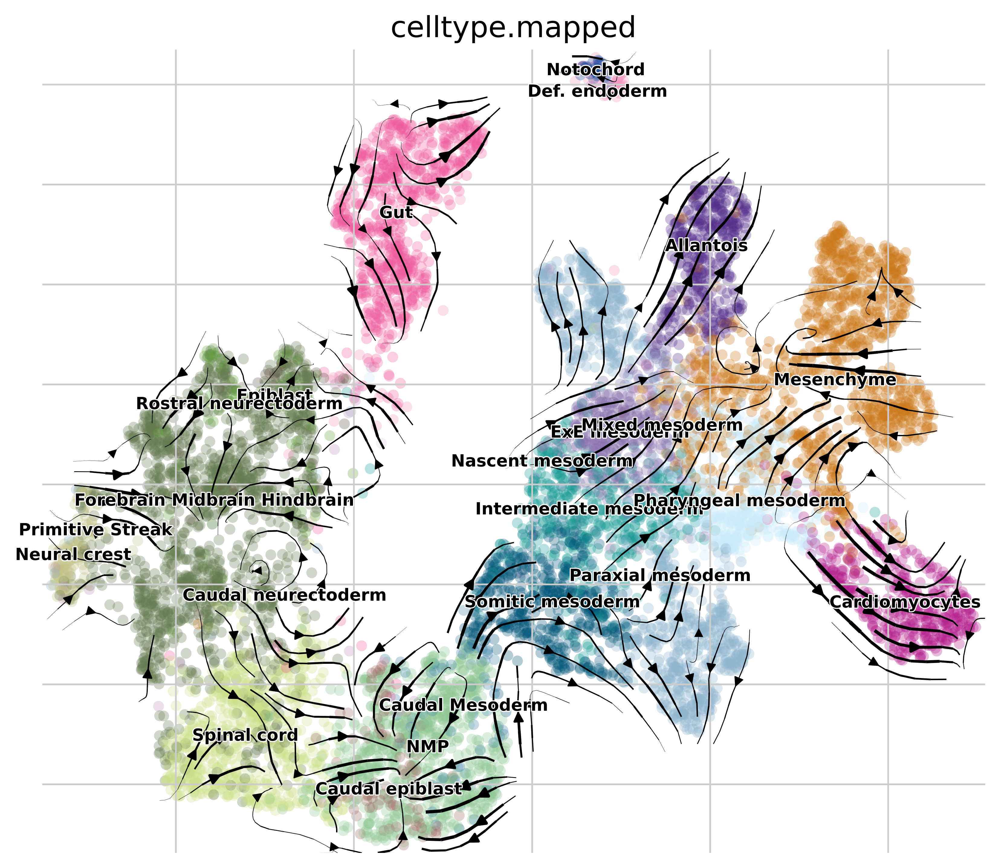

In [28]:
scv.pl.velocity_embedding_stream(adata, basis='umap', color='celltype.mapped', 
    legend_loc='on data', linewidth=1, legend_fontsize=8, dpi=500)

## Latent time

Gene-specific latent timepoints obtained from the dynamical model are coupled to a universal gene-shared latent time, which represents the cell’s internal clock and is based only on its transcriptional dynamics.

scvelo.tl.latent_time(data, vkey='velocity', min_likelihood=0.1, min_confidence=0.75, min_corr_diffusion=None, weight_diffusion=None, root_key=None, end_key=None, t_max=None, copy=False)

computing terminal states
    identified 2 regions of root cells and 2 regions of end points .
    finished (0:00:01) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)
computing latent time using root_cells as prior
    finished (0:00:04) --> added 
    'latent_time', shared time (adata.obs)


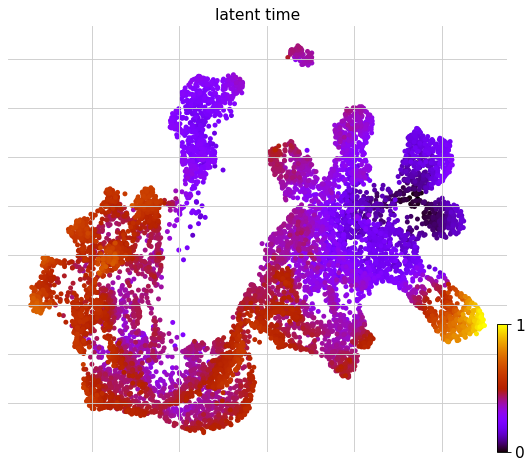

In [29]:
scv.tl.latent_time(adata)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=80)

## Phase portraits 

Now, let us examine the phase portraits of some marker genes, visualized with scv.pl.velocity(adata, gene_names) or scv.pl.scatter(adata, gene_names).

The black line corresponds to the estimated ‘steady-state’ ratio, i.e. the ratio of unspliced to spliced mRNA abundance which is in a constant transcriptional state. RNA velocity for a particular gene is determined as the residual, i.e. how much an observation deviates from that steady-state line. Positive velocity indicates that a gene is up-regulated, which occurs for cells that show higher abundance of unspliced mRNA for that gene than expected in steady state. Conversely, negative velocity indicates that a gene is down-regulated.

In [31]:
# all_genes = adata.var.index
#genes_to_plot = all_genes[all_genes.str.match("^Hb-*")][0]
genes_to_plot = "Sox17"

scvelo.pl.velocity(adata, var_names=None, basis=None, vkey='velocity', mode=None, fits=None, layers='all', color=None, color_map=None, colorbar=True, perc=[2, 98], alpha=0.5, size=None, groupby=None, groups=None, legend_loc='none', legend_fontsize=8, use_raw=False, fontsize=None, figsize=None, dpi=None, show=None, save=None, ax=None, ncols=None, **kwargs)

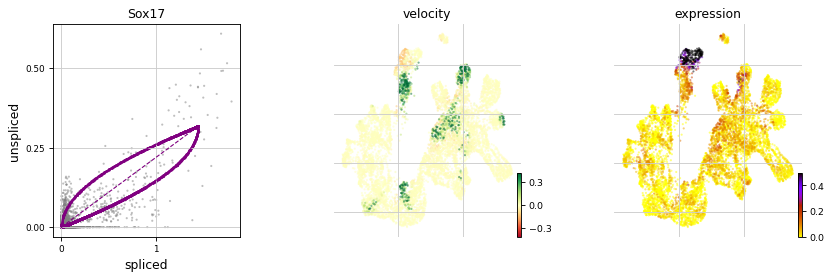

In [32]:
scv.pl.velocity(adata, genes_to_plot, size=15)

scvelo.pl.scatter(adata=None, basis=None, x=None, y=None, vkey=None, color=None, use_raw=None, layer=None, color_map=None, colorbar=None, palette=None, size=None, alpha=None, linewidth=None, linecolor=None, perc=None, groups=None, sort_order=True, components=None, projection=None, legend_loc=None, legend_loc_lines=None, legend_fontsize=None, legend_fontweight=None, legend_fontoutline=None, xlabel=None, ylabel=None, title=None, fontsize=None, figsize=None, xlim=None, ylim=None, add_density=None, add_assignments=None, add_linfit=None, add_polyfit=None, add_rug=None, add_text=None, add_text_pos=None, add_outline=None, outline_width=None, outline_color=None, n_convolve=None, smooth=None, rescale_color=None, color_gradients=None, dpi=None, frameon=None, zorder=None, ncols=None, nrows=None, wspace=None, hspace=None, show=None, save=None, ax=None, **kwargs)

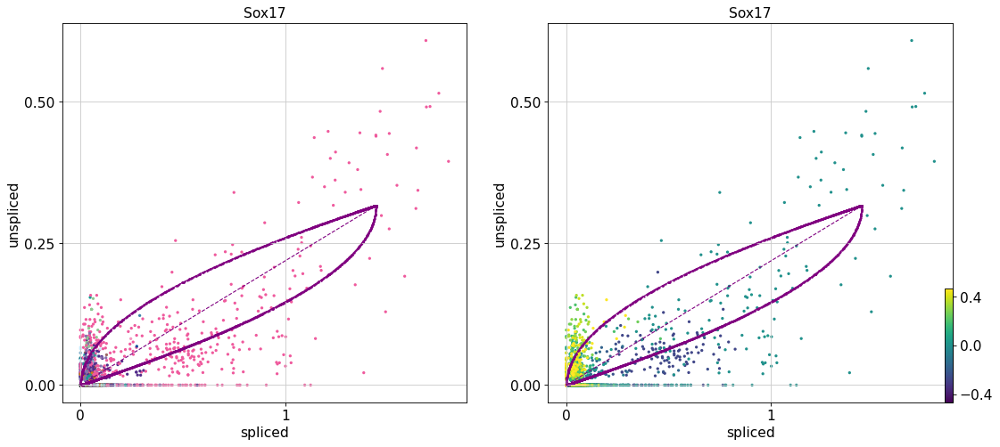

In [36]:
scv.pl.scatter(adata, genes_to_plot, size=35, color=['celltype.mapped', 'velocity'])

Driver genes display pronounced dynamic behavior and are systematically detected via their characterization by high likelihoods in the dynamic model.



In [ ]:
top_genes = adata.var['fit_likelihood'].sort_values(ascending=False).index
scv.pl.scatter(adata, basis=top_genes[:10], ncols=5, frameon=False)

Cluster-specific top-likelihood genes

In [ ]:
scv.tl.rank_dynamical_genes(adata, groupby='celltype.mapped')
df = scv.get_df(adata, 'rank_dynamical_genes/names')
df.head(5)

## Test

This applies a differential expression test (Welch t-test with overestimated variance to be conservative) on velocity expression, to find genes in a cluster that show dynamics that is transcriptionally regulated differently compared to all other clusters (e.g. induction in that cluster and homeostasis in remaining population). If no clusters are given, it priorly computes velocity clusters by applying louvain modularity on velocity  

scvelo.tl.rank_velocity_genes(data, vkey='velocity', n_genes=100, groupby=None, match_with=None, resolution=None, min_counts=None, min_r2=None, min_corr=None, min_dispersion=None, min_likelihood=None, copy=False)

In [ ]:
scv.tl.rank_velocity_genes(adata, groupby='celltype.mapped', min_corr=.3)

df = scv.DataFrame(adata.uns['rank_velocity_genes']['names'])
df.head()

In [ ]:
# genes_to_plot = df["Def._endoderm"].values[:4]
genes_to_plot = ["Dgkk"]
scv.pl.velocity(adata, genes_to_plot, size=15)

## Speed and coherence 

Two more useful stats: - The speed or rate of differentiation is given by the length of the velocity vector. - The coherence of the vector field (i.e., how a velocity vector correlates with its neighboring velocities) provides a measure of confidence.



In [37]:
scv.tl.velocity_confidence(adata)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


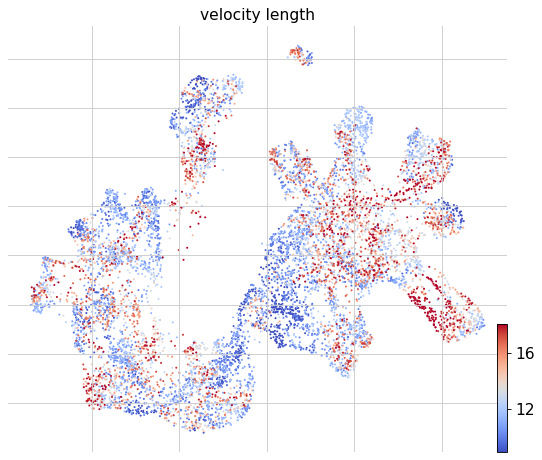

In [38]:
scv.pl.scatter(adata, c='velocity_length', cmap='coolwarm', perc=[5, 95])

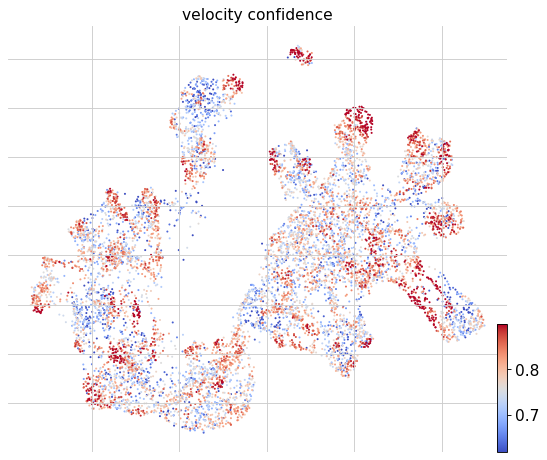

In [39]:
scv.pl.scatter(adata, c='velocity_confidence', cmap='coolwarm', perc=[5, 95])